 Simulation result from June 22-25

In [1]:
from __future__ import division

from cStringIO import StringIO
from salishsea_tools import (
    nc_tools,
    viz_tools,
    stormtools,
    tidetools,
)
from salishsea_tools.nowcast import figures

from matplotlib import pylab
from dateutil import tz
from matplotlib.backends import backend_agg as backend
from scipy import interpolate as interp
from matplotlib import animation
import scipy.io as sio
import datetime
import glob
import os
import arrow
import matplotlib.cm as cm
import matplotlib.dates as mdates
import matplotlib.gridspec as gridspec
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import netCDF4 as nc
import numpy as np
import pandas as pd
import requests
%matplotlib inline

In [2]:
SITES = {
    'Point Atkinson': {
        'lat': 49.33,
        'lon': -123.25,
        'msl': 3.09,
        'stn_no': 7795,
        'extreme_ssh': 5.61},
    'Victoria': {
        'lat': 48.41,
        'lon': -123.36,
        'msl': 1.8810,
        'stn_no': 7120,
        'extreme_ssh': 3.76},
    'Campbell River': {
        'lat': 50.04,
        'lon': -125.24,
        'msl': 2.916,
        'stn_no': 8074,
        'extreme_ssh': 5.35},
    'Neah Bay': {
        'lat': 48.4,
        'lon': -124.6,
        'stn_no':  9443090},
    'Friday Harbor': {
        'lat': 48.55,
        'lon': -123.016667,
        'stn_no': 9449880},
    'Cherry Point': {
        'lat': 48.866667,
        'lon': -122.766667,
        'stn_no': 9449424},
    'Sandheads': {
        'lat': 49.10,
        'lon': -123.30},
    'Tofino': {
        'stn_no': 8615},
    'VENUS': {
        'East': {
            'lat': 49.0419,
            'lon': -123.3176,
            'depth': 170},
        'Central': {
            'lat': 49.0401,
            'lon': -123.4261,
            'depth': 300}
        }
    }

# Font format
title_font = {
    'fontname': 'Bitstream Vera Sans', 'size': '22', 'color': 'black',
    'weight': 'medium'
}
axis_font = {'fontname': 'Bitstream Vera Sans', 'size': '20'}

In [3]:
def ebb_tide_time(grid_T, stn_name, PST , MSL = 0):
    "Determine ebb tide start time and end time in PST or UTC at\
    a given day at stations we got our tidal preditions"
    time_shift = datetime.timedelta(hours=-8)
    t_orig, t_end, t_nemo = figures.get_model_time_variables(grid_T)
    ttide = figures.get_tides(stn_name)
    time = ttide.time + PST * time_shift
    ssh = ttide.pred_all + SITES[stn_name]['msl'] * MSL
    for i in np.arange(len(ttide)):
        
        if (ttide.time[i].year == t_orig.year) & (ttide.time[i].month == t_orig.month)\
        & (ttide.time[i].day == t_orig.day):
            if (ssh[i] - ssh[i-1] >0) & (ssh[i] - ssh[i+1] >0):
                ebb_tide_start = ttide.time[i].hour
            
            if (ssh[i] - ssh[i-1] <0) & (ssh[i] - ssh[i+1] <0): 
                ebb_tide_end = ttide.time[i].hour
    if PST ==0:
        print "ebb tide begins at " + str(ebb_tide_start) +  ", ends at "\
        + str(ebb_tide_end) + " UTC time"
    else:
        print "ebb tide begins at " + str(ebb_tide_start) +  ", ends at "\
        + str(ebb_tide_end) + " PST time"
    return ebb_tide_start, ebb_tide_end  

In [4]:
def ebb_tide_time_more(grid_T, stn_name, PST , MSL = 0):
    "Determine ebb tide start time and end time in PST or UTC at\
    a given day at stations we got our tidal preditions"
    time_shift = datetime.timedelta(hours=-8)
    t_orig, t_end, t_nemo = figures.get_model_time_variables(grid_T)
    ttide = figures.get_tides(stn_name)
    time = ttide.time + PST * time_shift
    ssh = ttide.pred_all + SITES[stn_name]['msl'] * MSL
    for i in np.arange(len(ttide)):
        
        if (ttide.time[i].year == t_orig.year) & (ttide.time[i].month == t_orig.month)\
        & (ttide.time[i].day == t_orig.day):
            if (ssh[i] - ssh[i-1] <0) & (ssh[i] - ssh[i+1] <0): 
                ebb_tide_end = ttide.time[i].hour
            if (ssh[i] - ssh[i-1] >0) & (ssh[i] - ssh[i+1] >0):
                ebb_tide_start = ttide.time[i].hour
    if PST ==0:
        if ebb_tide_end <= ttide.time[8].hour: ##ebb_tide_end<=16
            if ebb_tide_end < ebb_tide_start:
                
                print "ebb tide begins at " + str(ebb_tide_start) +  ", ends at "\
                + str(ttide.time[15].hour) + " UTC time"
                return ebb_tide_start, ttide.time[15].hour
            else:
                print "ebb tide begins at " + str(ebb_tide_start) +  ", ends at "\
                + str(ebb_tide_end) + " UTC time"
                return ebb_tide_start, ebb_tide_end
    else:
        print "ebb tide begins at " + str(ebb_tide_start) +  ", ends at "\
        + str(ebb_tide_end) + " PST time" 
        return ebb_tide_start, ebb_tide_end

In [5]:
def results_dataset(period, grid, results_dir):
    """Return the results dataset for period (e.g. 1h or 1d)
    and grid (e.g. grid_T, grid_U) from results_dir.
    """
    filename_pattern = 'SalishSea_{period}_*_{grid}.nc'
    filepaths = glob(os.path.join(results_dir, filename_pattern.format(period=period, grid=grid)))
    return nc.Dataset(filepaths[0])

In [6]:
#subset
ist=260
ien=398
jst=350
jen=440
depth=0
x=np.arange(ist,ien)
y=np.arange(jst,jen)
smin, smax, dels = 0, 34, 1
cs = np.arange(smin,smax)
cmap = plt.get_cmap('spectral')
st=3

In [7]:
#subset for currents pcolor
cmin, cmax, dels = -2, 2, 0.2
css = np.arange(cmin,cmax)
cmap = plt.get_cmap('spectral')
st=3

In [8]:
def quiver_salinity(t, ax, lon, lat, Ss, bathy,Us, Vs, time):
    #ax.clear()

    mesh=ax.contourf(lon,lat,Ss[t],cs,cmap=cmap,extend='both')
    
    #quivers
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st], Us[t,::st,::st], Vs[t,::st,::st],
                       pivot='mid', width=0.003,scale=25, color='white',
                       headwidth=2,headlength=2)
    ax.quiverkey(quiver,-122.8,49.1, 1, '1 m/s',
                 coordinates='data', color='black', labelcolor='black',
                fontproperties = {'size': '20'})
    #land
    viz_tools.plot_land_mask(ax,bathy,coords='map',xslice=x,yslice=y,color='burlywood')
    
    #title
    timestamp = time[t]
        
    ax.set_title(timestamp.strftime('%d-%b-%Y %H:%M'), **title_font)
    plt.setp(ax.get_xticklabels(), fontsize=20)
    plt.setp(ax.get_yticklabels(), fontsize=20)
    ax.set_xlabel('Longitude', **axis_font)
    ax.set_ylabel('Latitude', **axis_font)
        
    
    return mesh

In [9]:
def quiver_salinity_contour(t, ax, lon, lat, Ss, bathy,Us, Vs, time):
 
    #land
    viz_tools.plot_land_mask(ax,bathy,coords='map',xslice=x,yslice=y,color='burlywood')
    mesh=ax.pcolormesh(lon,lat,Us[t], cmap='RdBu_r', vmin=cmin, vmax=cmax)
    #quivers
    quiver = ax.quiver(lon[::st,::st], lat[::st,::st], Us[t,::st,::st], Vs[t,::st,::st],
                       pivot='mid', width=0.003,scale=25, color='white',
                       headwidth=2,headlength=2)
    ax.quiverkey(quiver,-122.8,49.1, 1, '1 m/s',
                 coordinates='data', color='black', labelcolor='black',
                fontproperties = {'size': '20'})
    
    #title
    timestamp = time[t]
        
    ax.set_title(timestamp.strftime('%d-%b-%Y %H:%M'), **title_font)
    plt.setp(ax.get_xticklabels(), fontsize=20)
    plt.setp(ax.get_yticklabels(), fontsize=20)
    ax.set_xlabel('Longitude', **axis_font)
    ax.set_ylabel('Latitude', **axis_font)
        
    
    return mesh

In [10]:
def compare_currents_salinity(tt):
    '''This function was made to compare combination of surface current
        and salinity with original model result'''
    ## set up figure frame
    fig, axs = plt.subplots(tt, 2, figsize=(48, 100))

    #loop through files
    results_home_pre = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
    results_home_now = '/ocean/jieliu/research/meopar/river-treatment/14days_norefraserxml/'##
    #need to change result directory some time
    results_home = {results_home_pre: 0, \
               results_home_now: 1}
    for i in results_home.keys():
    
        #initalize arrays
        Us=np.zeros((1, y.shape[0],x.shape[0])) 
        Vs=np.zeros((1, y.shape[0],x.shape[0]))
        Ss=np.zeros((1, y.shape[0],x.shape[0]))
        time=np.array([])
        
        results_dir = os.path.join(i, run_date.strftime('%d%b%y').lower())
        grid_U = results_dataset('1h','grid_U',results_dir)
        grid_V = results_dataset('1h','grid_V',results_dir)
        grid_T = results_dataset('1h','grid_T',results_dir)
    
        #load variables
        U = grid_U.variables['vozocrtx'][hours[0].hour: hours[tt -1 ].hour + 1, 0,jst-1:jen,ist-1:ien]
        V = grid_V.variables['vomecrty'][hours[0].hour: hours[tt -1].hour + 1, 0,jst-1:jen,ist-1:ien]
        S = grid_T.variables['vosaline'][hours[0].hour: hours[tt -1].hour + 1, 0,jst:jen,ist:ien]

        #masking!!should not mask as if masked, the uE,vN array will be masked!
        #U = np.ma.masked_values(U,0)
        #V = np.ma.masked_values(V,0)

        #unstagger
        u,v = viz_tools.unstagger(U,V)
        #rotate
        theta = np.pi*29/180
        uE = u*np.cos(theta) - v*np.sin(theta)
        vN = u*np.sin(theta) +v*np.cos(theta)
        #append
        Us = np.append(Us,uE,axis=0)
        Vs = np.append(Vs,vN,axis=0)
        Ss = np.append(Ss,S,axis=0)

        t = nc_tools.timestamp(grid_T, np.arange(tt+ hours[0].hour))
        for ind in range(len(t)):
            t[ind] = t[ind].datetime
        time = np.append(time, t[hours[0].hour :]) 
    
        ##masking them and make 0(land) not show dot
        Us=Us[1:,:,:]; Us=np.ma.masked_values(Us,0)
        Vs=Vs[1:,:,:]; Vs=np.ma.masked_values(Vs,0)
        Ss=Ss[1:,:,:];
    

        if  results_home[i] ==0:
            bathy = nc.Dataset('/data/dlatorne/MEOPAR/NEMO-forcing/grid/bathy_meter_SalishSea2.nc') 
            #lats and lons
            lat = bathy.variables['nav_lat'][jst:jen,ist:ien]
            lon = bathy.variables['nav_lon'][jst:jen,ist:ien]
            for j in range(tt):
                ax = axs[j , 0]
                mesh = quiver_salinity(j, ax,lon,lat,Ss,bathy, Us, Vs, time) ## plot
                #quiver and salinity in different time
                cbar = plt.colorbar(mesh, ax=ax)
                cbar.set_label('Practical Salinity', **axis_font)
                plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', **axis_font)  
        elif results_home[i] ==1:
            bathy = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea5.nc')
            #lats and lons
            lat = bathy.variables['nav_lat'][jst:jen,ist:ien]
            lon = bathy.variables['nav_lon'][jst:jen,ist:ien]
            for j in range(tt):
                ax = axs[j , 1]
                mesh = quiver_salinity(j, ax, lon,lat,Ss,bathy, Us, Vs, time) ## plot 
                #quiver and salinity in different time
                cbar = plt.colorbar(mesh, ax=ax)
                cbar.set_label('Practical Salinity', **axis_font)
                plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', **axis_font)  
    return fig 

In [11]:
def compare_currents_salinity_contour(tt):
    '''This function was made to compare combination of surface current
        and salinity with original model result'''
    ## set up figure frame
    fig, axs = plt.subplots(tt, 2, figsize=(48, 100))

    #loop through files
    results_home_pre = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
    results_home_now = '/ocean/jieliu/research/meopar/river-treatment/14days_norefraserxml/'##
    #need to change result directory some time
    results_home = {results_home_pre: 0, \
               results_home_now: 1}
    for i in results_home.keys():
    
        #initalize arrays
        Us=np.zeros((1, y.shape[0],x.shape[0])) 
        Vs=np.zeros((1, y.shape[0],x.shape[0]))
        Ss=np.zeros((1, y.shape[0],x.shape[0]))
        time=np.array([])
        
        results_dir = os.path.join(i, run_date.strftime('%d%b%y').lower())
        grid_U = results_dataset('1h','grid_U',results_dir)
        grid_V = results_dataset('1h','grid_V',results_dir)
        grid_T = results_dataset('1h','grid_T',results_dir)
    
        #load variables
        U = grid_U.variables['vozocrtx'][hours[0].hour: hours[tt -1 ].hour + 1, 0,jst-1:jen,ist-1:ien]
        V = grid_V.variables['vomecrty'][hours[0].hour: hours[tt -1].hour + 1, 0,jst-1:jen,ist-1:ien]
        S = grid_T.variables['vosaline'][hours[0].hour: hours[tt -1].hour + 1, 0,jst:jen,ist:ien]

        #masking!!should not mask as if masked, the uE,vN array will be masked!
        #U = np.ma.masked_values(U,0)
        #V = np.ma.masked_values(V,0)

        #unstagger
        u,v = viz_tools.unstagger(U,V)
        #rotate
        theta = np.pi*29/180
        uE = u*np.cos(theta) - v*np.sin(theta)
        vN = u*np.sin(theta) +v*np.cos(theta)
        #append
        Us = np.append(Us,uE,axis=0)
        Vs = np.append(Vs,vN,axis=0)
        Ss = np.append(Ss,S,axis=0)

        t = nc_tools.timestamp(grid_T, np.arange(tt+ hours[0].hour))
        for ind in range(len(t)):
            t[ind] = t[ind].datetime
        time = np.append(time, t[hours[0].hour :]) 
    
        ##masking them and make 0(land) not show dot
        Us=Us[1:,:,:]; Us=np.ma.masked_values(Us,0)
        Vs=Vs[1:,:,:]; Vs=np.ma.masked_values(Vs,0)
        Ss=Ss[1:,:,:];

        if  results_home[i] ==0:
            bathy = nc.Dataset('/data/dlatorne/MEOPAR/NEMO-forcing/grid/bathy_meter_SalishSea2.nc') 
            #lats and lons
            lat = bathy.variables['nav_lat'][jst:jen,ist:ien]
            lon = bathy.variables['nav_lon'][jst:jen,ist:ien]
            for j in range(tt):
                ax = axs[j , 0]
                mesh = quiver_salinity_contour(j, ax,lon,lat,Ss,bathy, Us, Vs, time) ## plot
                #quiver and salinity in different time
                cbar = plt.colorbar(mesh, ax=ax)
                cbar.set_label('U velocity[m/s]', **axis_font)
                plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', **axis_font)  
        elif results_home[i] ==1:
            bathy = nc.Dataset('/ocean/jieliu/research/meopar/river-treatment/bathy_meter_SalishSea5.nc')
            #lats and lons
            lat = bathy.variables['nav_lat'][jst:jen,ist:ien]
            lon = bathy.variables['nav_lon'][jst:jen,ist:ien]
            for j in range(tt):
                ax = axs[j , 1]
                mesh = quiver_salinity_contour(j, ax, lon,lat,Ss,bathy, Us, Vs, time) ## plot 
                #quiver and salinity in different time
                cbar = plt.colorbar(mesh, ax=ax)
                cbar.set_label('U velocity[m/s]', **axis_font)
                plt.setp(plt.getp(cbar.ax.axes, 'yticklabels'), color='k', **axis_font)  
    return fig 

For 14 days simulation with north channel not until Howe
June 23

In [12]:
run_date = datetime.datetime(2015,6,23)##change each time
# previous results dataset location
results_home_pre = '/data/dlatorne/MEOPAR/SalishSea/nowcast/'
results_dir_pre = os.path.join(results_home_pre, run_date.strftime('%d%b%y').lower())
# new results dataset location
run_date = datetime.datetime(2015,6,23) ## also change each time
results_home_now = '/ocean/jieliu/research/meopar/river-treatment/14days_norefraserxml/'
results_dir_now = os.path.join(results_home_now, run_date.strftime('%d%b%y').lower())

In [13]:
from glob import glob
grid_T_pre = results_dataset('1h', 'grid_T', results_dir_pre)
grid_T_now = results_dataset('1h', 'grid_T', results_dir_now)
start_pre, end_pre = ebb_tide_time_more(grid_T_pre, 'Point Atkinson', PST = 0, MSL = 0)
start_time = datetime.datetime(2015,6,23, start_pre)
end_time = datetime.datetime(2015,6,23, end_pre)

numhours = (end_time - start_time).seconds //3600
hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]

ebb tide begins at 18, ends at 23 UTC time


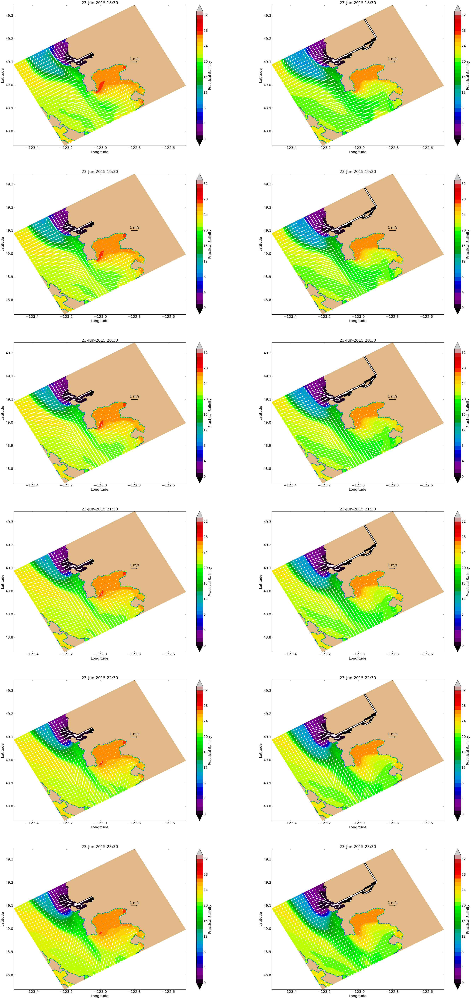

In [14]:
fig = compare_currents_salinity(len(hours))

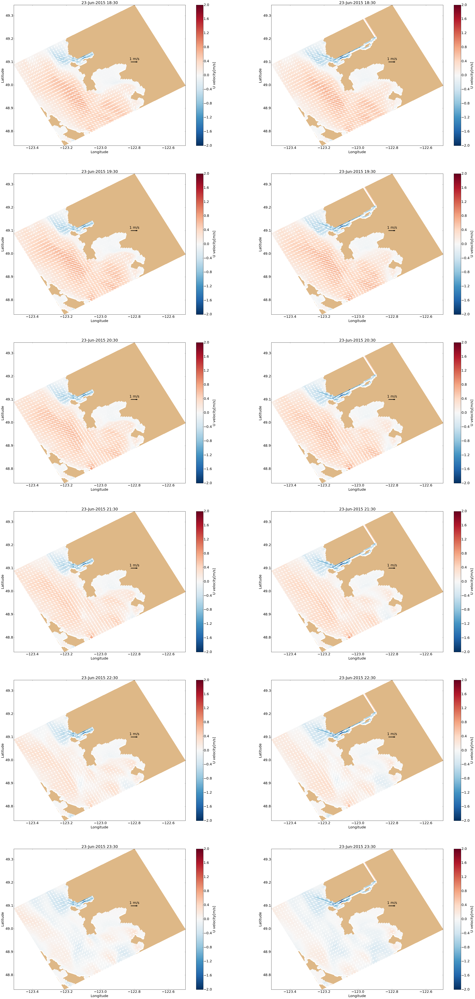

In [15]:
## u velocity 
fig = compare_currents_salinity_contour(len(hours))

June 24

In [16]:
run_date = datetime.datetime(2015,6,24)##change each time
# previous results dataset location
results_dir_pre = os.path.join(results_home_pre, run_date.strftime('%d%b%y').lower())
# new results dataset location
results_dir_now = os.path.join(results_home_now, run_date.strftime('%d%b%y').lower())

In [17]:
from glob import glob
grid_T_pre = results_dataset('1h', 'grid_T', results_dir_pre)
grid_T_now = results_dataset('1h', 'grid_T', results_dir_now)
start_pre, end_pre = ebb_tide_time_more(grid_T_pre, 'Point Atkinson', PST = 0, MSL = 0)
start_time = datetime.datetime(2015,6,24, start_pre)
end_time = datetime.datetime(2015,6,24, end_pre)

numhours = (end_time - start_time).seconds //3600
hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]

ebb tide begins at 20, ends at 23 UTC time


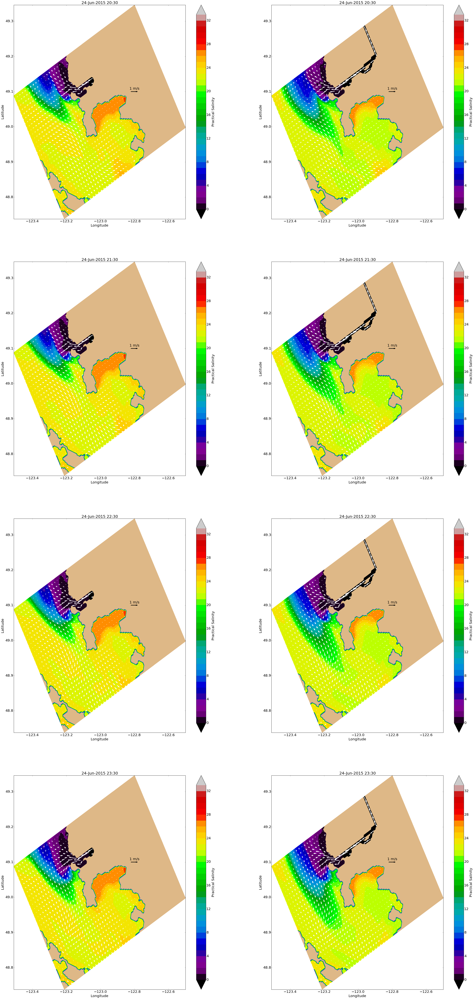

In [18]:
fig = compare_currents_salinity(len(hours))

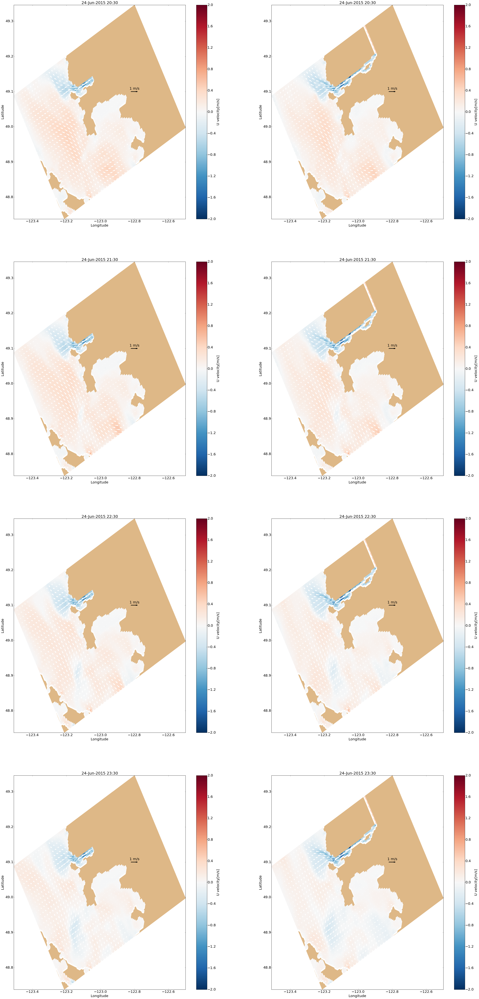

In [19]:
## u velocity 
fig = compare_currents_salinity_contour(len(hours))

June 25

In [20]:
run_date = datetime.datetime(2015,6,25)##change each time
# previous results dataset location
results_dir_pre = os.path.join(results_home_pre, run_date.strftime('%d%b%y').lower())
# new results dataset location
results_dir_now = os.path.join(results_home_now, run_date.strftime('%d%b%y').lower())

In [21]:
from glob import glob
grid_T_pre = results_dataset('1h', 'grid_T', results_dir_pre)
grid_T_now = results_dataset('1h', 'grid_T', results_dir_now)
start_pre, end_pre = ebb_tide_time_more(grid_T_pre, 'Point Atkinson', PST = 0, MSL = 0)
start_time = datetime.datetime(2015,6,25, start_pre)
end_time = datetime.datetime(2015,6,25, end_pre)

numhours = (end_time - start_time).seconds //3600
hours = [start_time + datetime.timedelta(hours=num)
             for num in range(0, numhours+1)]

ebb tide begins at 21, ends at 23 UTC time


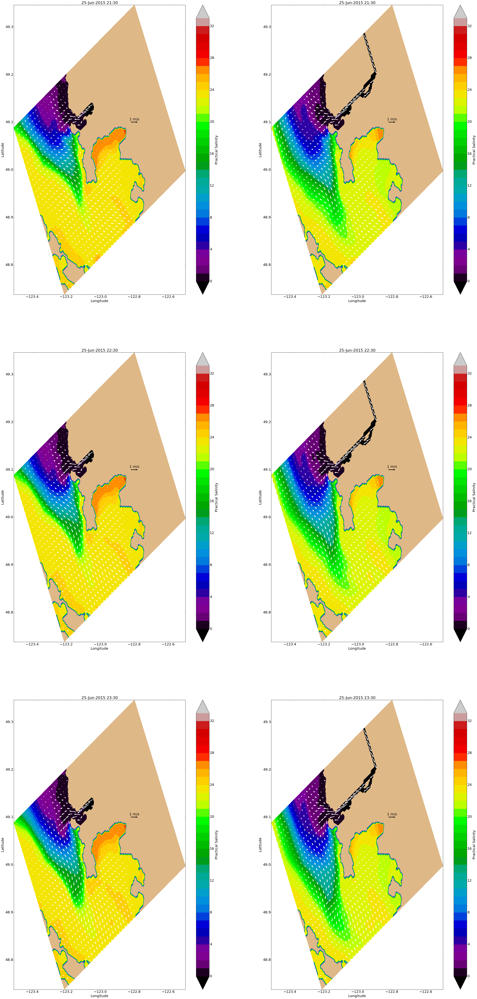

In [22]:
fig = compare_currents_salinity(len(hours))

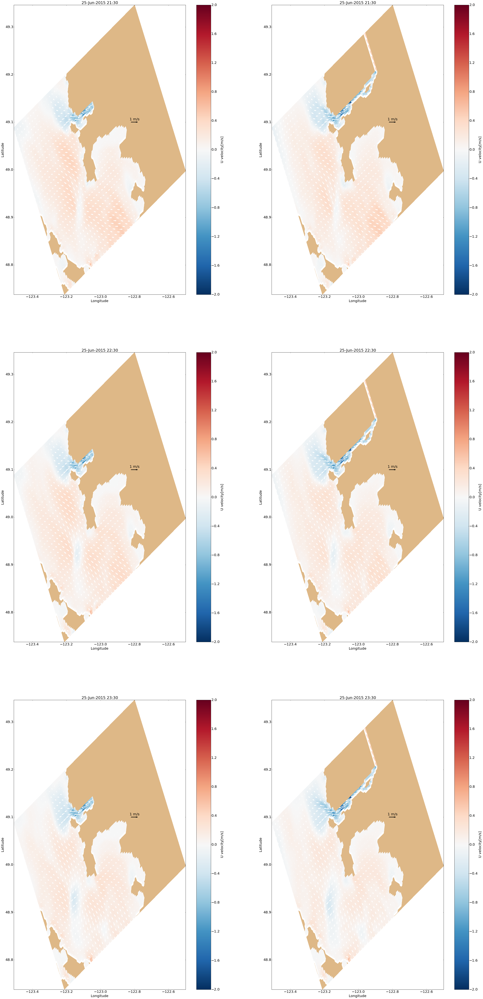

In [23]:
## u velocity 
fig = compare_currents_salinity_contour(len(hours))